# Dans ce code nous allons analyser la GFT d'un réseaux de neuronnes pour identifier un overfitting ou non


In [14]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import eigh
from tqdm import tqdm
import networkx as nx

# 1 Initialisation avec les fonctions de l'AE et la génration d'un dataset synthétique 

In [3]:
Fe = 48 
nsize = 48*3 #size of the signals
latent_dim = 30 # size of the latent space
deepness_size = 3 # number of layers in the encoder and decoder 

nb_poly = 3 # number of polynomials
nb_cos = 4 # number of cosines

mean_range = np.array([
    -0.788846816, 0.102034542, -0.00173098545, 
    0.434515409, 0.138392096, 0,
    0.401743465, 0.232343461,0,
    0.6, 1.04, 0,
    0.305239840, 2.08230408, 0
])
std_range = np.array([
    0.36591027, 0.0871927, 0.00391362, 
    0.10205803, 0.02908149, 3.14, 
    0.10561786, 0.06270634, 3.14, 
    0.39541111, 0.15985402, 3.14,
    0.304346102, 0.1594144, 3.14,
])
Lparam_std = 2*std_range
Lrange_low = mean_range - 1*std_range
Lrange_sup = mean_range + 1*std_range

In [6]:
class SignalGenerator:

    def __init__(self):
        self.time = None

    def generate_signal(self, a, b, w,phi, Fe = 48, num_samples=1000, noise_std=0.1):
        """
        Génère un signal basé sur les paramètres donnés.

        Args:
            a (list): Coefficients du polynôme (a0, a1, a2, a3).
            b (list): Amplitudes des cosinus.
            w (list): Fréquences des cosinus.
            phi (list): Phases des cosinus.
            num_samples (int): Nombre d'échantillons temporels par signal.
            time_range (tuple): Intervalle de temps (début, fin).
            noise_std (float): Écart-type du bruit ajouté.

        Returns:
            np.ndarray: Signal généré.
        """
        self.time = np.linspace(0, num_samples//Fe, num_samples)
        #a, b, w = self._sort_params(a, b, w)
        poly_part = sum(a[i] * (self.time ** i) for i in range(len(a)))
        cosine_part = sum(b[i] * np.cos(2*np.pi* w[i] * self.time+ phi[i]) for i in range(len(w)))
        noise = np.random.normal(0, noise_std, size=num_samples)
        signal = poly_part + cosine_part
        signal_noise = signal + noise
        
        signal_noise = (signal_noise - np.mean(signal))/np.std(signal)
        signal = (signal - np.mean(signal)) / np.std(signal)

        return signal_noise, signal

    def generate_dataset(self, num_signals, Lrange_low = Lrange_low, Lrange_sup = Lrange_sup , Fe= 48, num_samples=10000, noise_std=0.5):
        """
        Génère un dataset de signaux avec des paramètres aléatoires.

        Args:
            num_signals (int): Nombre de signaux à générer.
            a_range (tuple): Intervalle pour les coefficients du polynôme.
            b_range (tuple): Intervalle pour les amplitudes des cosinus.
            w_range (tuple): Intervalle pour les fréquences.
            num_samples (int): Nombre d'échantillons temporels par signal.
            time_range (tuple): Intervalle de temps (début, fin).
            noise_std (float): Écart-type du bruit ajouté.

        Returns:
            list: Liste de tuples (signal, paramètres).
        """
        dataset = []
        for _ in tqdm(range(num_signals), desc='generating signals'):
            # on génère les coefficients du polynome
            a = [np.random.uniform(Lrange_low[i], Lrange_sup[i]) for i in range(nb_poly)]
            # on génère les prams des cosinus
            b=[]
            w=[]
            phi=[]
            for ji in range(nb_cos):
                j = 3*ji+ nb_poly
                # print(Lrange_low[j], Lrange_sup[j])
                # print(Lrange_low[j+1], Lrange_sup[j+1])
                # print(Lrange_low[j+2], Lrange_sup[j+2])
                b.append(np.random.uniform(Lrange_low[j], Lrange_sup[j]))
                w.append(np.random.uniform(Lrange_low[j+1], Lrange_sup[j+1]))
                phi.append(np.random.uniform(Lrange_low[j+2], Lrange_sup[j+2]))
            
            w.sort()

            signal_noise, signal = self.generate_signal(a, b, w,phi, Fe=Fe,  num_samples=num_samples, noise_std=noise_std)

            dataset.append((signal_noise, signal, {"a": a, "b": b, "w": w, "phi": phi}))

        return dataset

In [7]:
class SignalAutoEncoder(nn.Module):
    def __init__(self, nsize=1000, latent_size=14, deepness=3):
        super(SignalAutoEncoder, self).__init__()
        # Calcul du facteur pour réduire la taille
        factor = (nsize / latent_size) ** (1 / deepness)  # Réduction progressive
        #  Encoder
        self.encoder_layers = []
        for i in range(deepness - 1):
            in_size = int(round(nsize / factor**(i)))
            out_size = int(round(nsize / factor**(i + 1)))
            self.encoder_layers.append(nn.Linear(in_size, out_size))
            self.encoder_layers.append(nn.ReLU())
        self.encoder_layers.append(nn.Linear(int(round(nsize / factor**(deepness - 1))), latent_size))
        self.encoder = nn.Sequential(*self.encoder_layers)
        
        #  Decoder
        self.decoder_layers = []
        for i in range(deepness - 1):
            in_size = int(round(latent_size * factor**(i)))
            out_size = int(round(latent_size * factor**(i + 1)))
            self.decoder_layers.append(nn.Linear(in_size, out_size))
            self.decoder_layers.append(nn.ReLU())
        self.decoder_layers.append(nn.Linear(int(round(latent_size * factor**(deepness - 1))), nsize))
        self.decoder = nn.Sequential(*self.decoder_layers)
        
        

    def forward(self, x):
        """
        Passe avant de l'autoencodeur.

        Args:
            x (torch.Tensor): Signal d'entrée.

        Returns:
            torch.Tensor: Signal reconstruit.
            torch.Tensor: Représentation latente.
        """
        z = self.encoder(x)
        x_reconstructed = self.decoder(z)
        return x_reconstructed, z

In [8]:
generator = SignalGenerator()
full_dataset = generator.generate_dataset(num_signals=10, Lrange_low=Lrange_low, Lrange_sup = Lrange_sup,Fe = Fe, num_samples=nsize, noise_std=0.00)

Xtrain_signals = []
Ytrain_signals = []
train_params = []
for i in range (len(full_dataset)):
    Xtrain_signals.append(full_dataset[i][0])
    Ytrain_signals.append(full_dataset[i][1])
    train_params.append(np.concatenate([value for _, value in full_dataset[i][2].items()]))

Xtrain_signals_tensor = torch.tensor(Xtrain_signals, dtype=torch.float32)
Ytrain_signals_tensor = torch.tensor(Ytrain_signals, dtype=torch.float32)
train_params_tensor = torch.tensor(train_params, dtype=torch.float32)

generating signals: 100%|██████████| 10/10 [00:00<?, ?it/s]
C:\Users\zehav\AppData\Local\Temp\ipykernel_34608\4123682105.py:12: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\torch\csrc\utils\tensor_new.cpp:281.)
  Xtrain_signals_tensor = torch.tensor(Xtrain_signals, dtype=torch.float32)


In [106]:
Xtrain_signals_tensor_overfit = torch.tensor([[-5.7438e-01, -4.4312e-01, -3.0598e-01, -1.6818e-01, -3.5772e-02,
          8.4768e-02,  1.8694e-01,  2.6468e-01,  3.1279e-01,  3.2732e-01,
          3.0588e-01,  2.4781e-01,  1.5436e-01,  2.8547e-02, -1.2490e-01,
         -2.9985e-01, -4.8915e-01, -6.8501e-01, -8.7947e-01, -1.0649e+00,
         -1.2345e+00, -1.3824e+00, -1.5045e+00, -1.5980e+00, -1.6619e+00,
         -1.6970e+00, -1.7055e+00, -1.6907e+00, -1.6569e+00, -1.6090e+00,
         -1.5518e+00, -1.4898e+00, -1.4270e+00, -1.3661e+00, -1.3089e+00,
         -1.2560e+00, -1.2065e+00, -1.1587e+00, -1.1099e+00, -1.0569e+00,
         -9.9637e-01, -9.2502e-01, -8.4033e-01, -7.4060e-01, -6.2536e-01,
         -4.9550e-01, -3.5332e-01, -2.0251e-01, -4.8003e-02,  1.0434e-01,
          2.4804e-01,  3.7644e-01,  4.8311e-01,  5.6235e-01,  6.0953e-01,
          6.2150e-01,  5.9677e-01,  5.3571e-01,  4.4055e-01,  3.1528e-01,
          1.6539e-01, -2.3671e-03, -1.8048e-01, -3.6105e-01, -5.3632e-01,
         -6.9908e-01, -8.4314e-01, -9.6358e-01, -1.0571e+00, -1.1219e+00,
         -1.1581e+00, -1.1673e+00, -1.1522e+00, -1.1168e+00, -1.0656e+00,
         -1.0034e+00, -9.3472e-01, -8.6366e-01, -7.9339e-01, -7.2598e-01,
         -6.6230e-01, -6.0197e-01, -5.4350e-01, -4.8441e-01, -4.2161e-01,
         -3.5168e-01, -2.7129e-01, -1.7753e-01, -6.8359e-02,  5.7194e-02,
          1.9876e-01,  3.5453e-01,  5.2126e-01,  6.9442e-01,  8.6836e-01,
          1.0367e+00,  1.1927e+00,  1.3296e+00,  1.4412e+00,  1.5224e+00,
          1.5692e+00,  1.5794e+00,  1.5524e+00,  1.4896e+00,  1.3943e+00,
          1.2712e+00,  1.1265e+00,  9.6756e-01,  8.0197e-01,  6.3757e-01,
          4.8182e-01,  3.4133e-01,  2.2154e-01,  1.2645e-01,  5.8435e-02,
          1.8184e-02,  4.8058e-03,  1.5992e-02,  4.8301e-02,  9.7509e-02,
          1.5901e-01,  2.2821e-01,  3.0095e-01,  3.7380e-01,  4.4436e-01,
          5.1140e-01,  5.7493e-01,  6.3614e-01,  6.9723e-01,  7.6119e-01,
          8.3142e-01,  9.1140e-01,  1.0043e+00,  1.1124e+00,  1.2374e+00,
          1.3792e+00,  1.5367e+00,  1.7071e+00,  1.8862e+00,  2.0688e+00,
          2.2486e+00,  2.4188e+00,  2.5726e+00,  2.7033e+00],
        [ 9.4131e-01,  8.4181e-01,  7.2812e-01,  6.1054e-01,  4.9855e-01,
          4.0002e-01,  3.2055e-01,  2.6298e-01,  2.2726e-01,  2.1045e-01,
          2.0709e-01,  2.0970e-01,  2.0954e-01,  1.9748e-01,  1.6485e-01,
          1.0433e-01,  1.0742e-02, -1.1842e-01, -2.8256e-01, -4.7792e-01,
         -6.9768e-01, -9.3244e-01, -1.1708e+00, -1.4002e+00, -1.6078e+00,
         -1.7817e+00, -1.9114e+00, -1.9890e+00, -2.0097e+00, -1.9721e+00,
         -1.8784e+00, -1.7344e+00, -1.5488e+00, -1.3327e+00, -1.0987e+00,
         -8.6019e-01, -6.3006e-01, -4.1995e-01, -2.3940e-01, -9.5234e-02,
          8.9035e-03,  7.2628e-02,  9.8715e-02,  9.2711e-02,  6.2322e-02,
          1.6646e-02, -3.4713e-02, -8.2544e-02, -1.1889e-01, -1.3777e-01,
         -1.3575e-01, -1.1223e-01, -6.9522e-02, -1.2656e-02,  5.1089e-02,
          1.1283e-01,  1.6289e-01,  1.9170e-01,  1.9069e-01,  1.5313e-01,
          7.4821e-02, -4.5408e-02, -2.0544e-01, -3.9990e-01, -6.2043e-01,
         -8.5622e-01, -1.0948e+00, -1.3227e+00, -1.5268e+00, -1.6951e+00,
         -1.8174e+00, -1.8864e+00, -1.8980e+00, -1.8518e+00, -1.7507e+00,
         -1.6012e+00, -1.4125e+00, -1.1956e+00, -9.6313e-01, -7.2759e-01,
         -5.0093e-01, -2.9347e-01, -1.1322e-01,  3.4669e-02,  1.4816e-01,
          2.2837e-01,  2.7928e-01,  3.0728e-01,  3.2044e-01,  3.2772e-01,
          3.3806e-01,  3.5952e-01,  3.9843e-01,  4.5882e-01,  5.4197e-01,
          6.4619e-01,  7.6696e-01,  8.9722e-01,  1.0280e+00,  1.1490e+00,
          1.2498e+00,  1.3205e+00,  1.3525e+00,  1.3399e+00,  1.2792e+00,
          1.1705e+00,  1.0174e+00,  8.2643e-01,  6.0732e-01,  3.7188e-01,
          1.3340e-01, -9.4379e-02, -2.9820e-01, -4.6628e-01, -5.8909e-01,
         -6.6009e-01, -6.7610e-01, -6.3750e-01, -5.4811e-01, -4.1483e-01,
         -2.4702e-01, -5.5724e-02,  1.4725e-01,  3.5024e-01,  5.4271e-01,
          7.1597e-01,  8.6386e-01,  9.8312e-01,  1.0736e+00,  1.1379e+00,
          1.1816e+00,  1.2117e+00,  1.2367e+00,  1.2656e+00,  1.3065e+00,
          1.3663e+00,  1.4498e+00,  1.5590e+00,  1.6932e+00,  1.8484e+00,
          2.0181e+00,  2.1934e+00,  2.3637e+00,  2.5177e+00]])

# 2. Analyse des AE avec la GFT

In [156]:
# **1. Charger le modèle**
def load_model(model_path, input_dim, latent_dim, deepness_size):
    model = SignalAutoEncoder(input_dim, latent_dim, deepness_size)
    model.load_state_dict(torch.load(model_path))  # Charger les poids
    model.eval()  # Mode évaluation
    print("Modèle chargé avec succès.")
    return model

def plot_model_output(model, input_signal):
    with torch.no_grad():
        signal_output, latent = model.forward(input_signal)
    plt.clf()
    plt.plot(input_signal.detach().numpy(), label='input signal')
    plt.plot(signal_output.detach().numpy(), label='output output')
    plt.legend()
    plt.show()

# **2. Construire le graphe à partir des poids**
def build_adjacency_matrix_from_model(model):
    # 1. Identifiez le nombre de neurones dans chaque couche
    layer_sizes = []  # Stocke la taille (nombre de neurones) de chaque couche
    adjacency_blocks = []  # Stocke les blocs de connexions entre couches

    for module in model.modules():
        if isinstance(module, torch.nn.Linear):  # Si la couche est un nn.Linear
            in_features = module.in_features  # Nombre de neurones d'entrée
            out_features = module.out_features  # Nombre de neurones de sortie
            layer_sizes.append(in_features)  # Ajoutez la taille d'entrée
            adjacency_blocks.append(module.weight.detach().numpy())  # Poids de la couche
    # Ajoutez la taille de la dernière couche de sortie
    layer_sizes.append(out_features)

    # 2. Créez la matrice d'adjacence globale
    nbneuronne_total = sum(layer_sizes)  # Nombre total de neurones
    adjacency_matrix = np.zeros((nbneuronne_total, nbneuronne_total))  # Matrice globale

    # 3. Remplissez la matrice d'adjacence en parcourant les blocs
    start_idx = 0  # Début de l'indice des neurones pour chaque couche
    for block, size_in, size_out in zip(adjacency_blocks, layer_sizes[:-1], layer_sizes[1:]):
        end_idx = start_idx + size_in
        next_start_idx = end_idx
        next_end_idx = next_start_idx + size_out

        # Ajoutez les poids au bon endroit dans la matrice d'adjacence
        adjacency_matrix[ next_start_idx:next_end_idx, start_idx:end_idx] = np.abs(block)
        start_idx = next_start_idx

    # 4. Rendre la matrice symétrique
    adjacency_matrix = adjacency_matrix + adjacency_matrix.T

    return adjacency_matrix,  layer_sizes

def plot_neural_network_graph(adjacency_matrix, layer_sizes, threshold = 0.1):
    """
    Trace un graphe représentant un réseau de neurones en organisant les nœuds par couches.

    Arguments :
    - adjacency_matrix : np.ndarray
        Matrice d'adjacence (symétrique pour un graphe non orienté).
    - layer_sizes : list[int]
        Liste contenant le nombre de neurones par couche.

    """
    # 0. Filtrer la matrice d'adjacence avec le seuil
    adjacency_matrix_filtered = np.where(adjacency_matrix >= threshold, adjacency_matrix, 0)
    # 1. Création du graphe
    G = nx.from_numpy_array(adjacency_matrix_filtered)

    # 2. Calcul des positions des nœuds
    # Positionner chaque couche sur une ligne distincte
    positions = {}
    current_index = 0
    neuron_spacing = 4  # Espacement entre les neurones
    for layer_idx, layer_size in enumerate(layer_sizes):
        for i in range(layer_size):
            positions[current_index] = (layer_idx, -i*neuron_spacing)  # (x, y) : x = couche, y = index du neurone
            current_index += 1

    # 3. Tracé du graphe
    plt.figure(figsize=(15, 10))
    nx.draw(
        G,
        pos=positions,
        with_labels=False,  # Pas de labels sur les nœuds
        node_size=10,  # Taille des nœuds
        node_color="skyblue",  # Couleur des nœuds
        edge_color="gray",  # Couleur des arêtes
        width=0.5,  # Épaisseur des arêtes
        alpha=0.7  # Transparence des arêtes
    )

    # 4. Ajouter des labels pour les couches
    for layer_idx, layer_size in enumerate(layer_sizes):
        plt.text(
            layer_idx, 1, f"Couche {layer_idx+1}", fontsize=0.1, ha="center", color="black"
        )

    # 5. Afficher le graphe
    plt.title("Réseau de neurones - Graphe des connexions")
    plt.axis("off")
    plt.show()


def get_all_neuron_activations(model, input_signal):
    """
    Récupère les activations de tous les neurones du modèle dans un grand vecteur,
    aligné avec la méthode de comptage des neurones.

    Arguments :
    - model : nn.Module
        Modèle PyTorch (par ex. votre autoencodeur).
    - input_signal : torch.Tensor
        Signal d'entrée à passer dans le modèle.

    Retourne :
    - activations_vector : np.ndarray
        Vecteur d'activations de tous les neurones.
    """
    activations = []  # Liste pour stocker les activations dans l'ordre des couches

    # Hook pour capturer les activations
    def hook_fn(module, input, output):
        if isinstance(output, torch.Tensor):
            activations.append(output.detach().numpy())  # Ajouter les activations de la couche

    # Ajouter les activations d'entrée (avant la première couche linéaire)
    activations.append(input_signal.detach().numpy().flatten())  # Ajouter le signal d'entrée

    # Enregistrer les hooks sur toutes les couches linéaires
    hooks = []
    for module in model.modules():
        if isinstance(module, torch.nn.Linear):  # Inclure les couches linéaires
            hooks.append(module.register_forward_hook(hook_fn))

    # Passer le signal dans le modèle
    with torch.no_grad():
        model(input_signal)

    # Supprimer les hooks
    for hook in hooks:
        hook.remove()

    # Concaténer toutes les activations dans un grand vecteur
    activations_vector = np.concatenate([a.flatten() for a in activations], axis=0)

    return activations_vector


def plot_signal_on_graph(adjacency_matrix, layer_sizes, activations_vector, threshold=0.12):
    """
    Trace le graphe en affichant un signal (valeurs d'activation) sur les nœuds.

    Arguments :
    - adjacency_matrix : np.ndarray
        Matrice d'adjacence (symétrique pour un graphe non orienté).
    - layer_sizes : list[int]
        Liste contenant le nombre de neurones par couche.
    - activations_vector : np.ndarray
        Vecteur des activations, aligné avec l'ordre de la matrice d'adjacence.
    - threshold : float
        Seuil minimal pour conserver une arête.
    """
    import matplotlib.cm as cm
    import matplotlib.colors as mcolors

    # Filtrer les arêtes par le seuil
    adjacency_matrix_filtered = np.where(adjacency_matrix >= threshold, adjacency_matrix, 0)

    # Créer le graphe
    G = nx.from_numpy_array(adjacency_matrix_filtered)

    # Calculer les positions des nœuds
    positions = {}
    current_index = 0
    layer_spacing = 1
    neuron_spacing = 10

    for layer_idx, layer_size in enumerate(layer_sizes):
        for i in range(layer_size):
            positions[current_index] = (layer_idx * layer_spacing, -i * neuron_spacing)
            current_index += 1

    # Normaliser les activations pour les couleurs des nœuds
    norm = mcolors.Normalize(vmin=activations_vector.min(), vmax=activations_vector.max())
    node_colors = cm.viridis(norm(activations_vector))

    # Tracer le graphe
    plt.figure(figsize=(12, 14))
    nx.draw(
        G,
        pos=positions,
        with_labels=False,
        node_color=node_colors,
        node_size=60,
        vmin=activations_vector.min(),  # Minimum pour l'échelle des couleurs
        vmax=activations_vector.max(),  # Maximum pour l'échelle des couleurs
        edge_color="gray",
        width=0.5,
        alpha=0.7
    )

    # # Ajouter une colorbar pour les activations
    # sm = cm.ScalarMappable(cmap="viridis", norm=norm)
    # sm.set_array([])  # Nécessaire pour associer le ScalarMappable à la colorbar
    # plt.colorbar(sm, label="Activation")

    # Ajouter le titre et afficher
    plt.title("Signal d'activation de l'autoencodeur", fontsize=14)
    plt.axis("off")
    plt.show()


def compute_laplacian(adjacency_matrix, normalized=False):
    """
    Calcule la matrice de Laplacien (classique ou normalisée) à partir de la matrice d'adjacence.

    Arguments :
    - adjacency_matrix : np.ndarray
        Matrice d'adjacence du graphe.
    - normalized : bool (par défaut False)
        Si True, calcule le Laplacien normalisé.

    Retourne :
    - laplacian : np.ndarray
        Matrice de Laplacien (classique ou normalisée).
    """
    
    if normalized:
        # Calcul du Laplacien normalisé : L_norm = I - D^(-1/2) A D^(-1/2)
        # Inversion des racines carrées des degrés
        # with np.errstate(divide='ignore'):  # Gérer les divisions par zéro pour les nœuds isolés
        #     d_inv_sqrt = np.diag(1.0 / np.sqrt(np.sum(adjacency_matrix, axis=1)))
        #     d_inv_sqrt[np.isinf(d_inv_sqrt)] = 0  # Remplacer les infinis par 0 (nœuds isolés)
        
        # # Calcul du Laplacien normalisé
        # laplacian = np.eye(adjacency_matrix.shape[0]) - d_inv_sqrt @ adjacency_matrix @ d_inv_sqrt
        adjacency_matrix_normalized = adjacency_matrix/np.sum(adjacency_matrix)
        laplacian = np.eye(adjacency_matrix.shape[0]) - adjacency_matrix_normalized
    else :
        # Calcul de la matrice des degrés (somme des lignes de la matrice d'adjacence)
        degree_matrix = np.diag(np.sum(adjacency_matrix, axis=1))
    
        laplacian = degree_matrix - adjacency_matrix
    
    return laplacian

# **3. Calculer la GFT**
def compute_gft(signal, laplacian):
    eigvals, eigvecs = eigh(laplacian)  # Décomposition spectrale
    gft_spectrum = eigvecs.T @ signal  # Projection sur les modes propres
    eigvals = eigvals / eigvals.max()  # Normalisation des valeurs propres
    return eigvals, gft_spectrum

def compute_smoothness(Laplacian, signal):
    """
    Calcule la régularité du signal en utilisant la matrice de Laplacien.

    Arguments :
    - Laplacian : np.ndarray
        Matrice de Laplacien du graphe.
    - signal : np.ndarray
        Signal d'entrée.

    Retourne :
    - smoothness : float
        Mesure de la régularité du signal.
    """
    # Calcul de la régularité
    smoothness = signal @ Laplacian @ signal
    print("smoothness : ", smoothness)
    return smoothness

# **Tracer le spectre GFT**
def plot_gft_spectrum(eigvals, gft_spectrum):
    """
    Trace le spectre GFT des activations latentes avec des points.

    Arguments :
    - eigvals : np.ndarray
        Les valeurs propres (fréquences du graphe).
    - gft_spectrum : np.ndarray
        Le spectre GFT (amplitudes associées aux valeurs propres).
    """
    plt.figure(figsize=(10, 6))  # Taille de la figure
    plt.scatter(
        eigvals, 
        np.abs(gft_spectrum), 
        color="purple", 
        edgecolor="black",  # Contours des points pour les rendre plus lisibles
        s=10,  # Taille des points
        alpha=0.8,  # Transparence
        label="Amplitude du spectre GFT"
    )
    plt.title("Spectre GFT des activations latentes", fontsize=16, fontweight="bold")
    plt.xlabel("Valeurs propres (fréquences)", fontsize=14)
    plt.ylabel("Amplitude", fontsize=14)
    plt.grid(color="gray", linestyle="--", linewidth=0.5, alpha=0.7)  # Grille discrète
    plt.xticks(fontsize=12)  # Taille des graduations sur l'axe x
    plt.yticks(fontsize=12)  # Taille des graduations sur l'axe y
    plt.tight_layout()  # Ajuste les marges pour éviter les débordements
    plt.show()
# # **6. Tracer le spectre GFT**
# def plot_gft_spectrum(eigvals, gft_spectrum):
#     plt.figure(figsize=(10, 5))
#     plt.plot(eigvals, np.abs(gft_spectrum), color = "purple")
#     plt.title("Spectre GFT des activations latentes")
#     plt.xlabel("Valeurs propres (fréquences)")
#     plt.ylabel("Amplitude")
#     plt.grid()
#     plt.show()

In [143]:
path_overfit = "AE_graph_overfitting.pth"
path_no_overfit = "AE_graph_no_overfitting.pth"


In [157]:
def AE_Analysis(path_AE, signal_tensor, threshold = 0.1, plot_results = True): 
    model = load_model(path_AE, nsize, latent_dim, deepness_size)
    if plot_results:
        plot_model_output(model, signal_tensor)
    adjacency_matrix, layer_sizes = build_adjacency_matrix_from_model(model)
    if plot_results:
        plot_neural_network_graph(adjacency_matrix, layer_sizes, threshold = threshold)
    activations_vector = get_all_neuron_activations(model, signal_tensor)
    if plot_results:
        plot_signal_on_graph(adjacency_matrix, layer_sizes, activations_vector, threshold=threshold)
    laplacian = compute_laplacian(adjacency_matrix)
    eigvals, gft_spectrum = compute_gft(activations_vector, laplacian)
    smoothness = compute_smoothness(laplacian, activations_vector)
    plot_gft_spectrum(eigvals, gft_spectrum)
    return model, adjacency_matrix, layer_sizes, activations_vector, laplacian, eigvals, gft_spectrum , smoothness

Affichage des résultat pour un signal présent dans le dataset d'entrainement de l'AE qui a overfitter 

Modèle chargé avec succès.


C:\Users\zehav\AppData\Local\Temp\ipykernel_34608\4266857243.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))  # Charger les

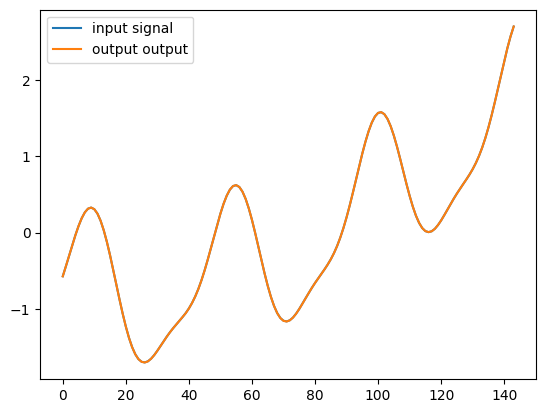

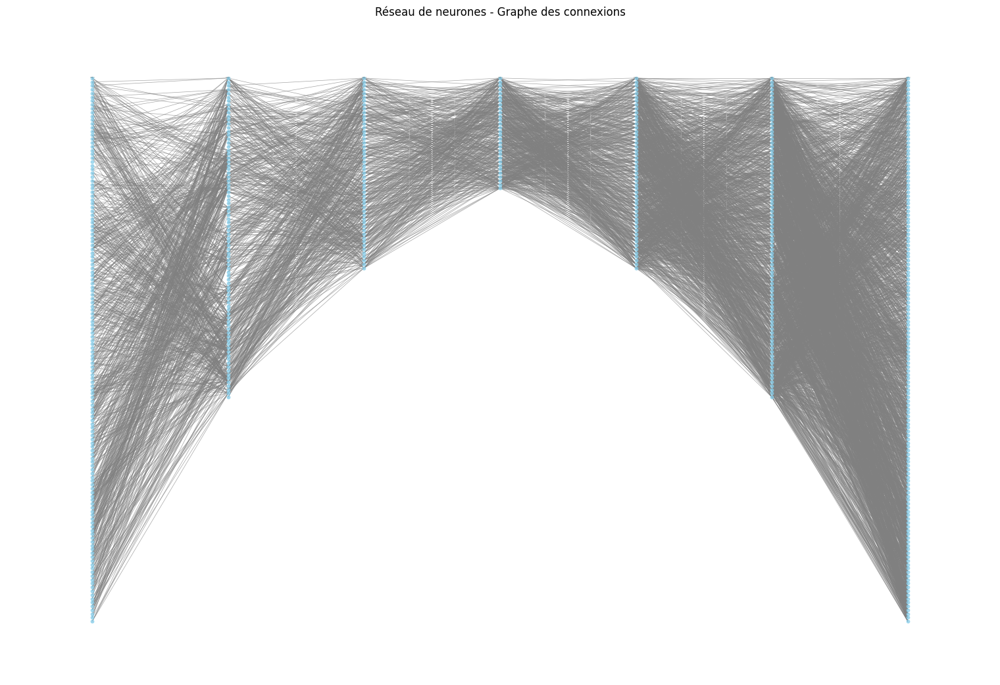

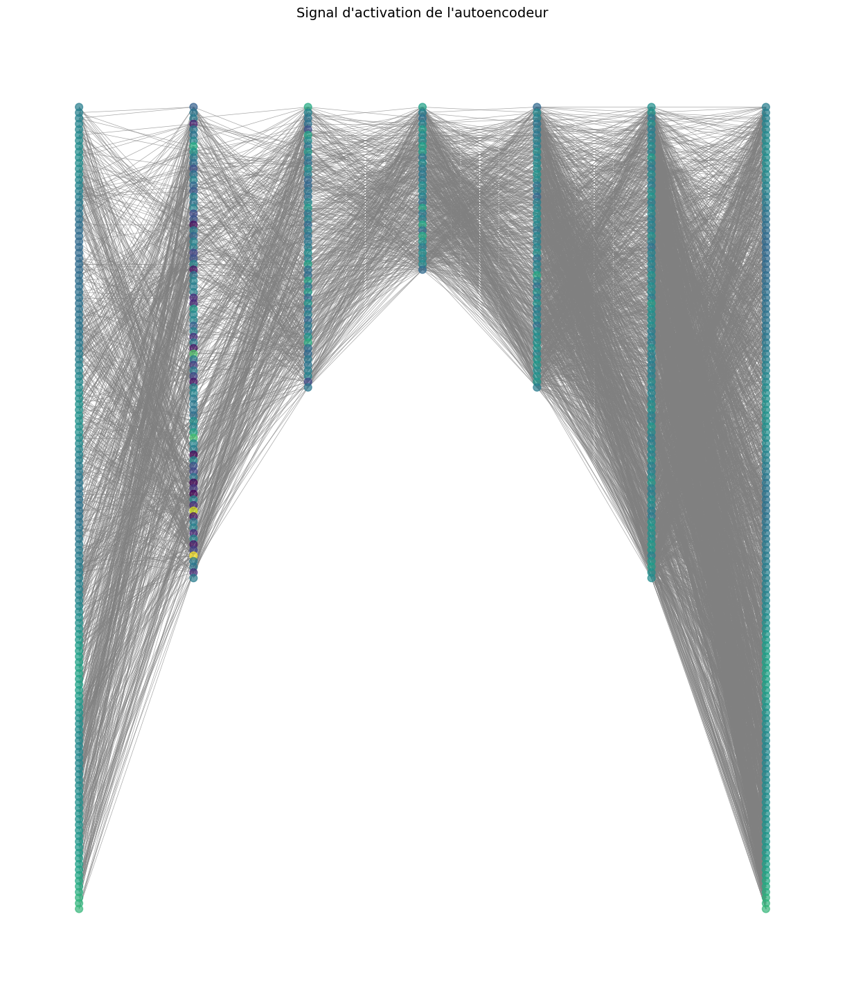

smoothness :  11224.030274862018


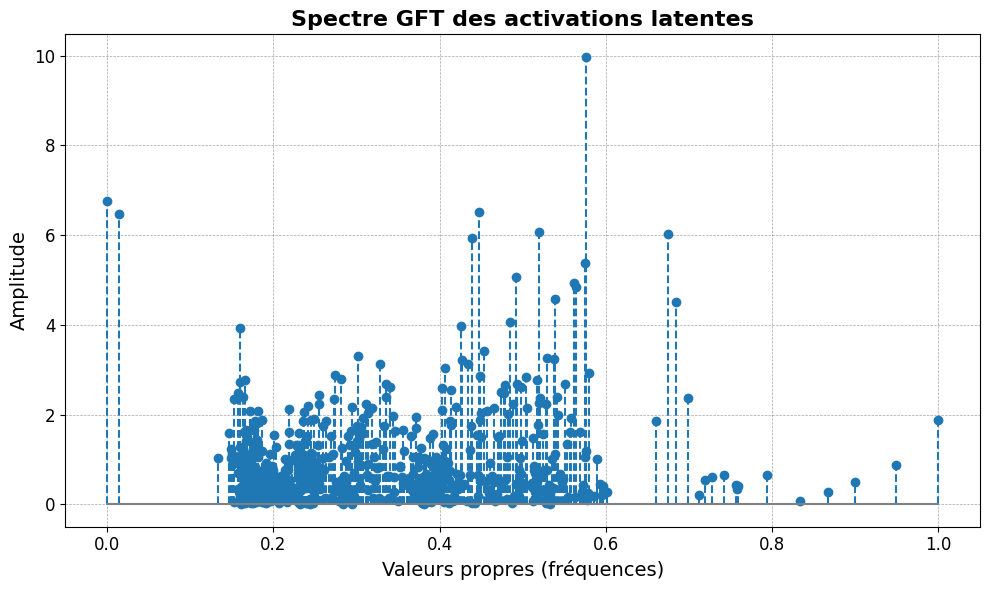

Modèle chargé avec succès.


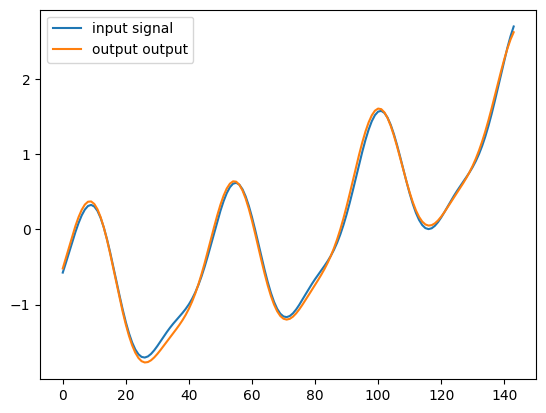

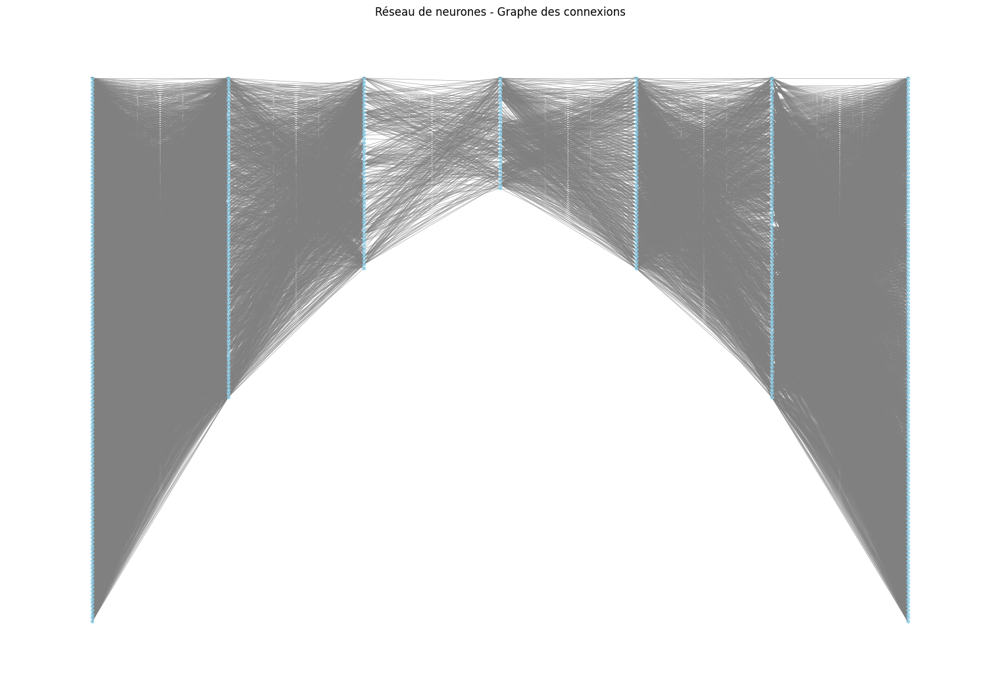

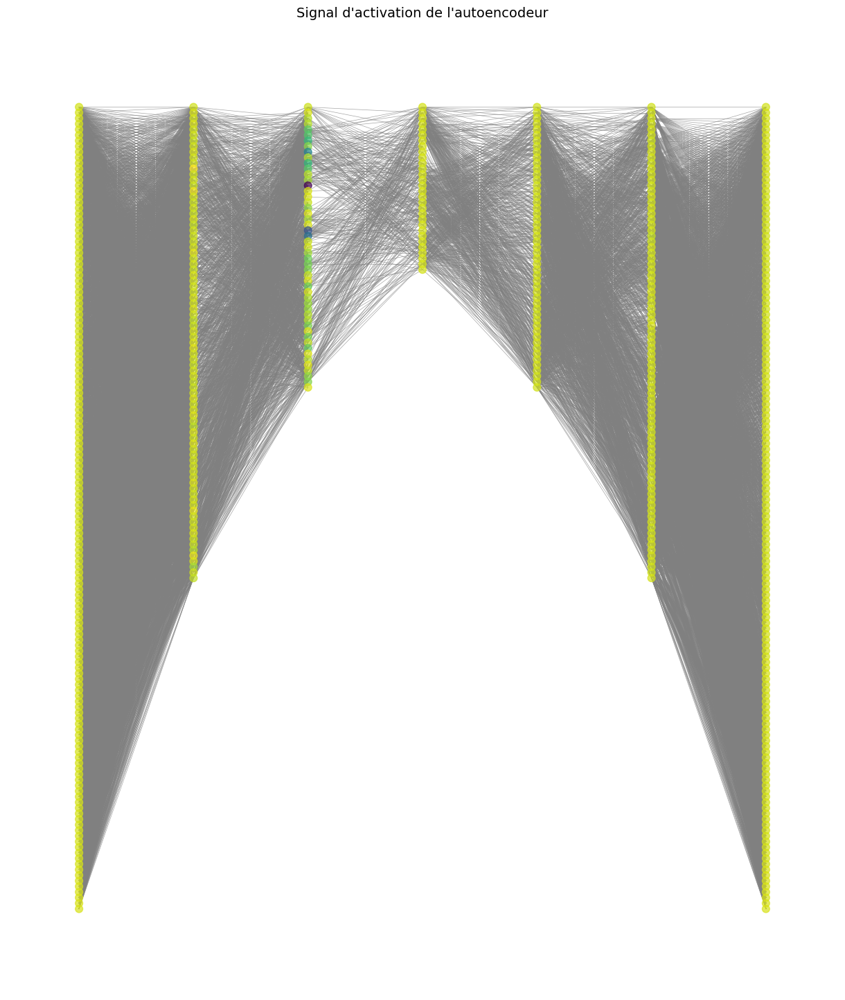

smoothness :  25845621.424178015


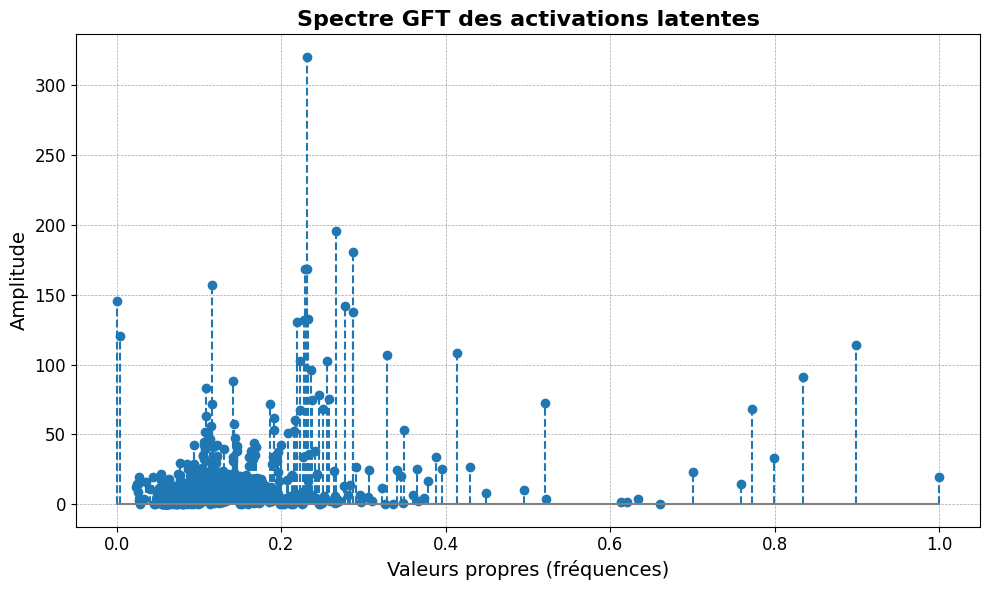

In [158]:
model_overfit, adjacency_matrix_overfit, layer_sizes_overfit, activations_vector_overfit, laplacian_overfit, eigvals_overfit, gft_spectrum_overfit, smoothness_overfit = AE_Analysis(path_overfit, Xtrain_signals_tensor_overfit[0], threshold = 0.1)
model_no_overfit, adjacency_matrix_no_overfit, layer_sizes_no_overfit, activations_vector_no_overfit, laplacian_no_overfit, eigvals_no_overfit, gft_spectrum_no_overfit, smoothness_no_overfit = AE_Analysis(path_no_overfit, Xtrain_signals_tensor_overfit[0], threshold = 0.15)

In [155]:
import matplotlib
print(matplotlib.__version__)  # Devrait afficher une version >= 3.4.0

3.10.0


A présent, nous faisons le calcul pour un signal absent de leur dataset de départ, donc un signal Test : 

Modèle chargé avec succès.


C:\Users\zehav\AppData\Local\Temp\ipykernel_34608\699486633.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))  # Charger les 

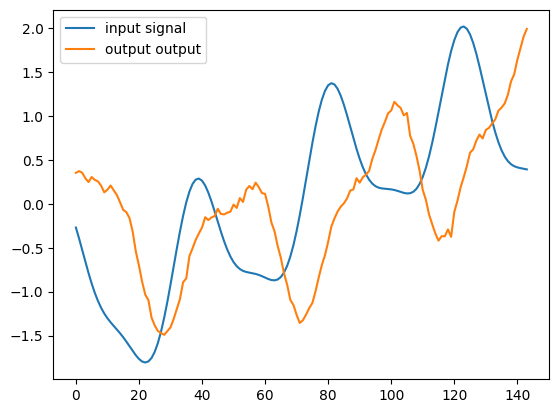

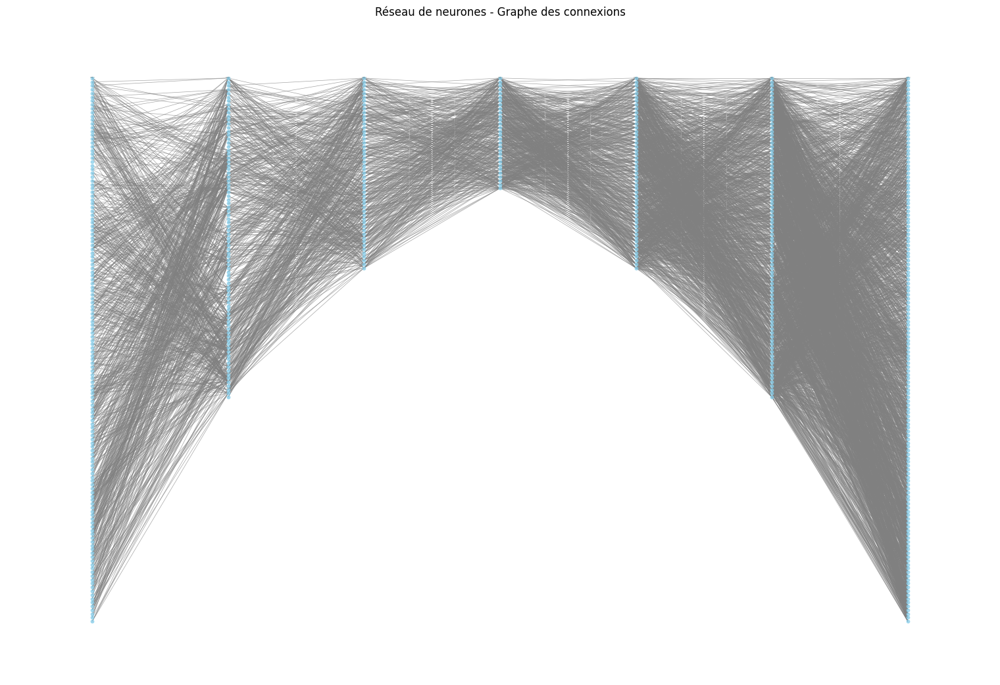

c:\Users\zehav\OneDrive\Bureau\ENS\S5_ARIA\stage_3mois_graph\Projet_github\.venv\Lib\site-packages\networkx\drawing\nx_pylab.py:457: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  node_collection = ax.scatter(


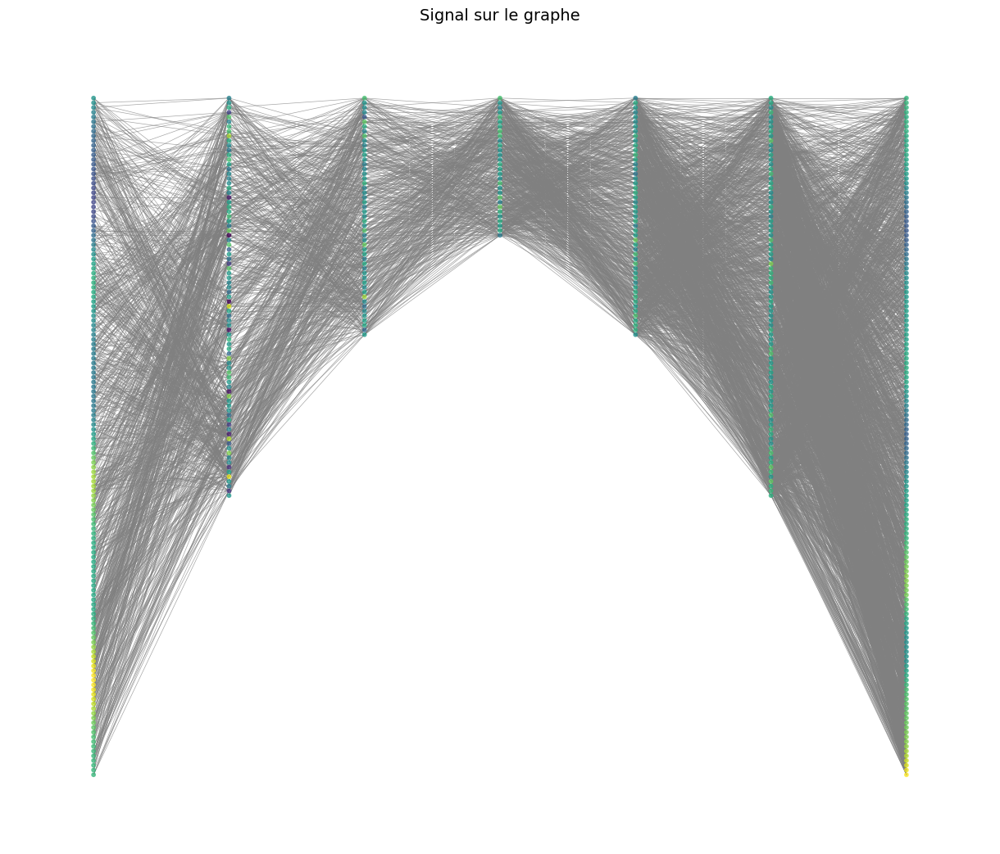

smoothness :  2536.5412091452317


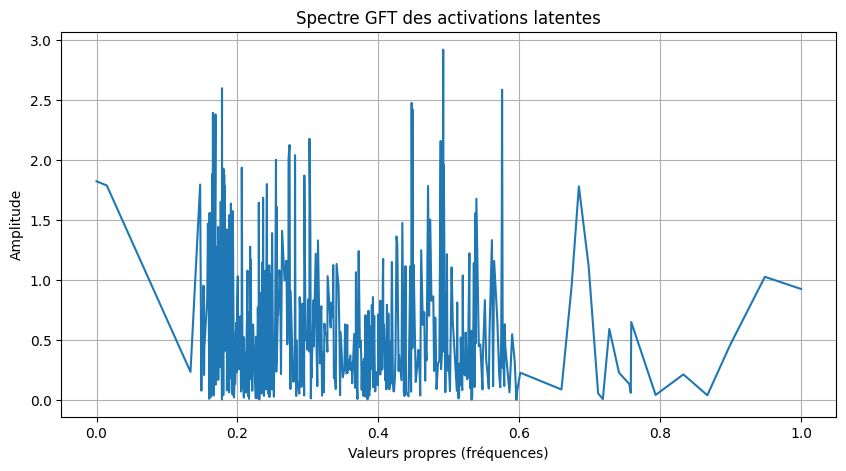

Modèle chargé avec succès.


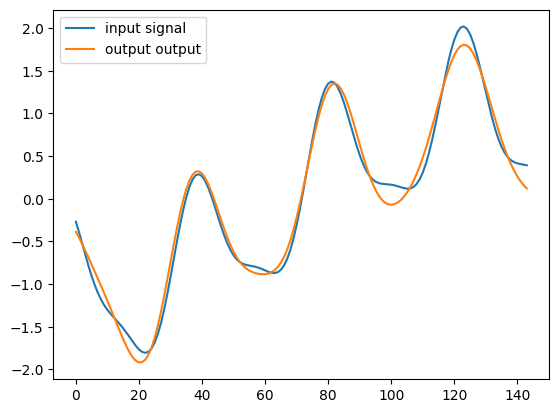

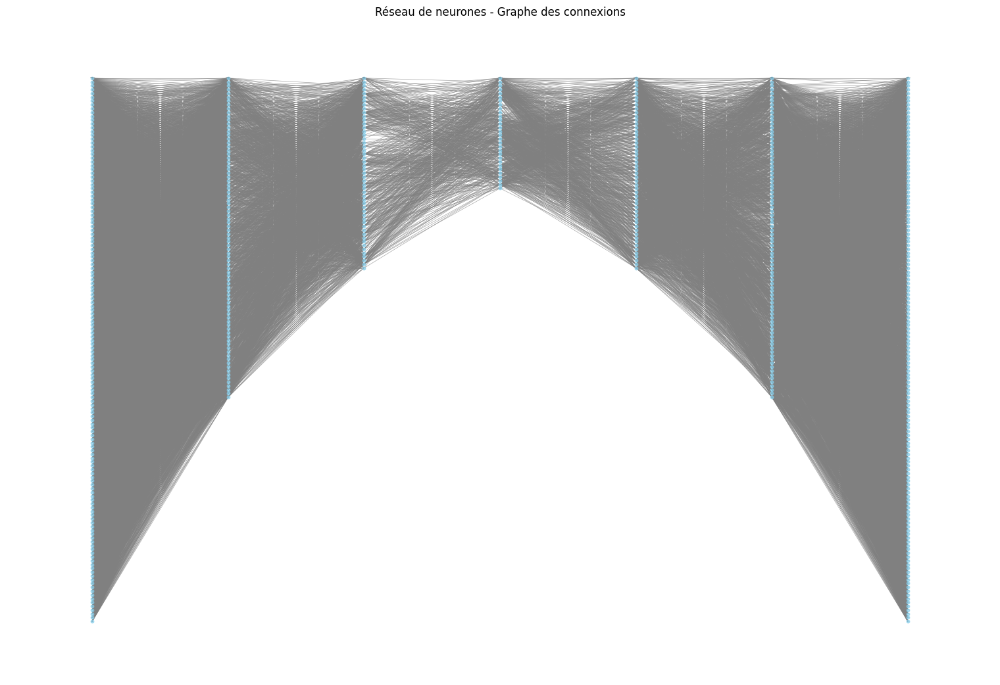

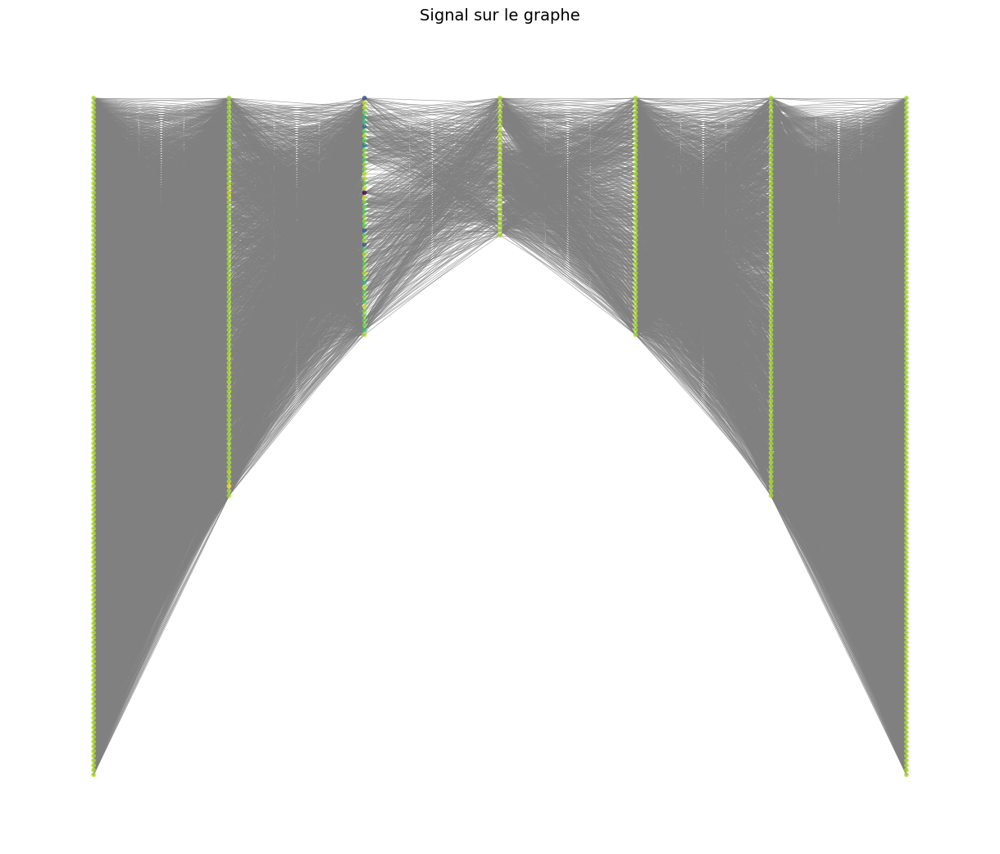

smoothness :  8179932.49833653


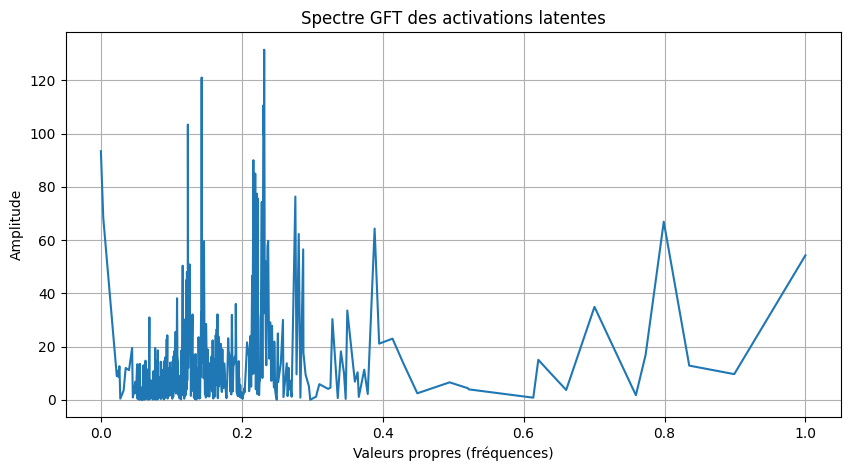

In [138]:
model_overfit, adjacency_matrix_overfit, layer_sizes_overfit, activations_vector_overfit, laplacian_overfit, eigvals_overfit, gft_spectrum_overfit, smoothness_overfit = AE_Analysis(path_overfit, Xtrain_signals_tensor[0], threshold = 0.1)
model_no_overfit, adjacency_matrix_no_overfit, layer_sizes_no_overfit, activations_vector_no_overfit, laplacian_no_overfit, eigvals_no_overfit, gft_spectrum_no_overfit, smoothness_no_overfit = AE_Analysis(path_no_overfit, Xtrain_signals_tensor[0], threshold = 0.1)

overfit
Modèle chargé avec succès.


C:\Users\zehav\AppData\Local\Temp\ipykernel_34608\4286793148.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))  # Charger les

smoothness :  2536.5412091452317


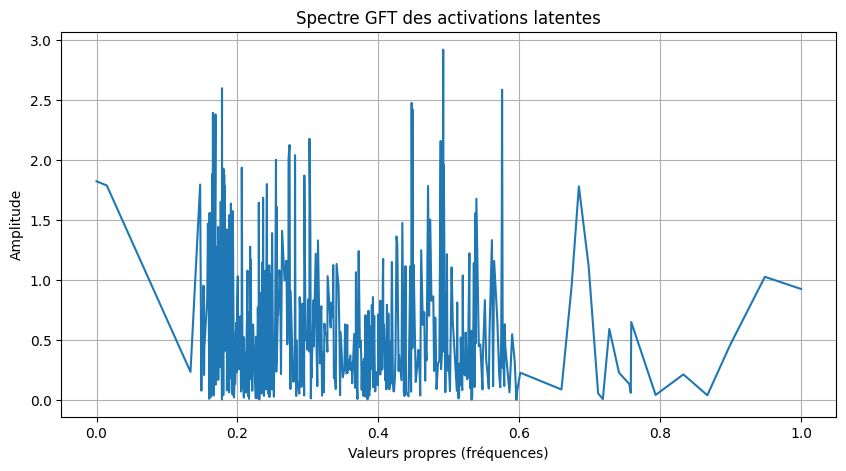

no overfit
Modèle chargé avec succès.
smoothness :  8179932.49833653


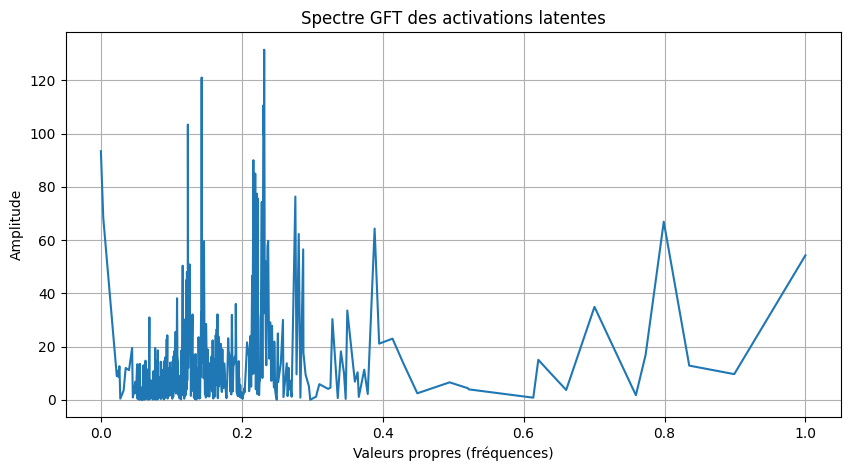

overfit
Modèle chargé avec succès.
smoothness :  3195.102178340842


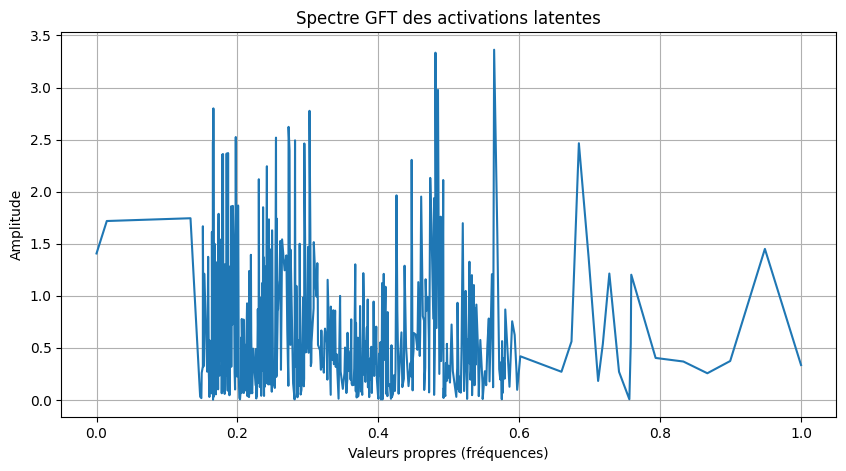

no overfit
Modèle chargé avec succès.
smoothness :  9040610.853032717


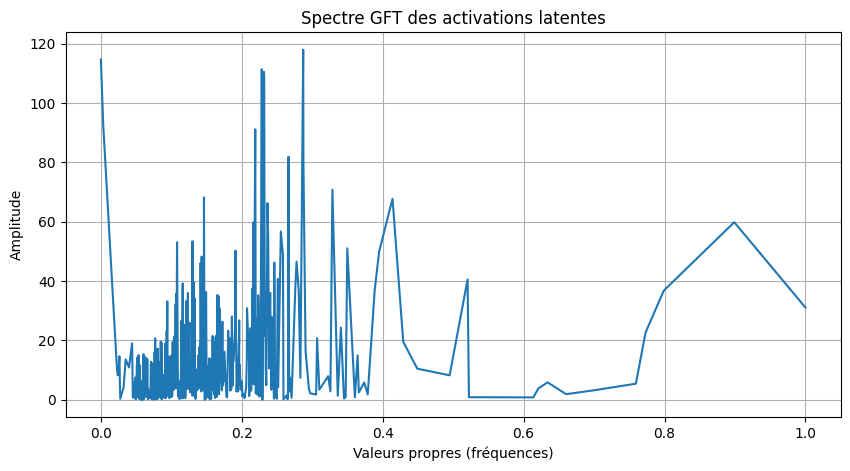

overfit
Modèle chargé avec succès.
smoothness :  2840.516819381918


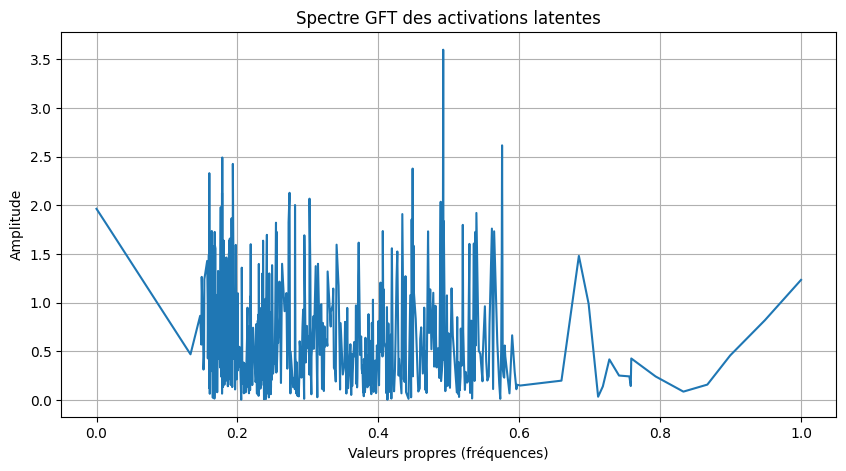

no overfit
Modèle chargé avec succès.
smoothness :  2311516.5113170706


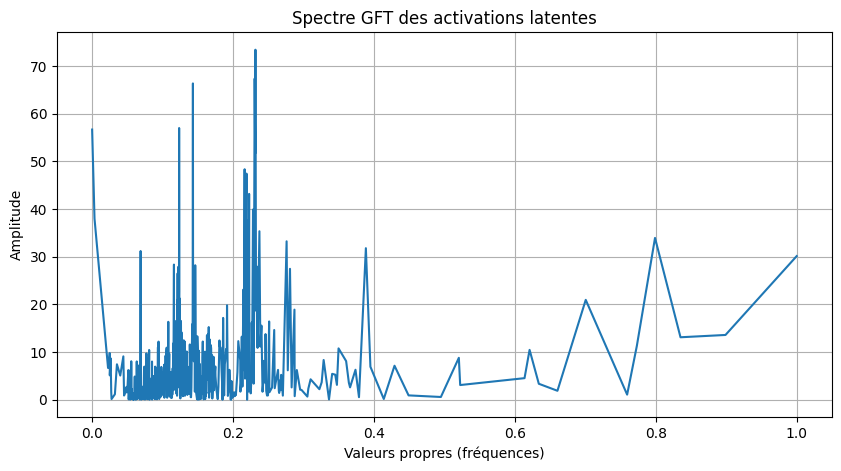

overfit
Modèle chargé avec succès.
smoothness :  4383.048555355377


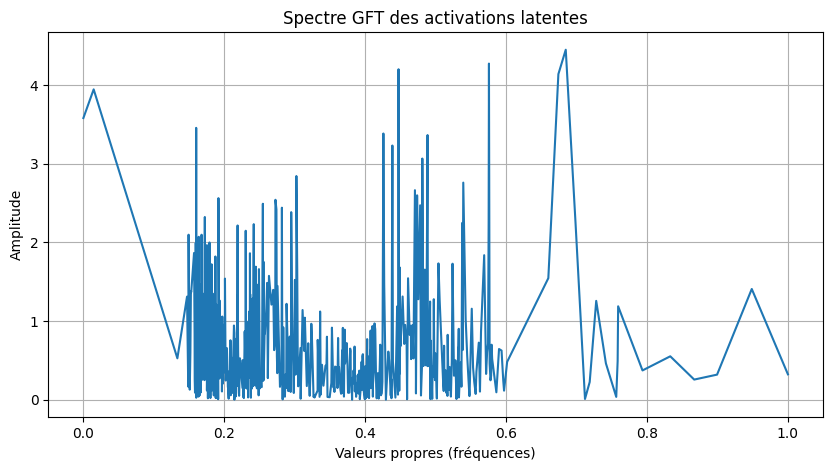

no overfit
Modèle chargé avec succès.
smoothness :  16232159.218813872


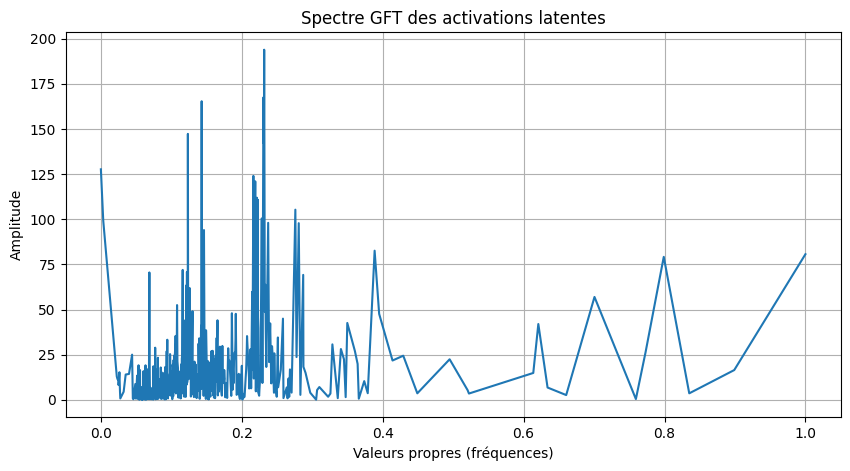

overfit
Modèle chargé avec succès.
smoothness :  3432.5607344818795


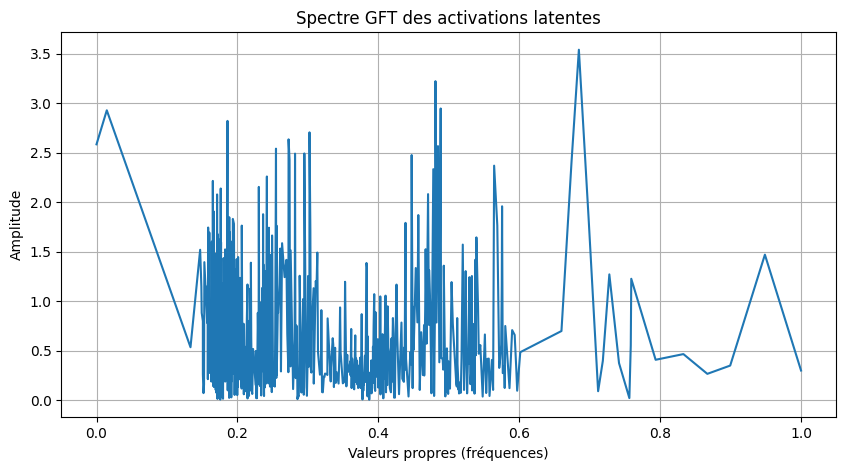

no overfit
Modèle chargé avec succès.
smoothness :  26983498.971891344


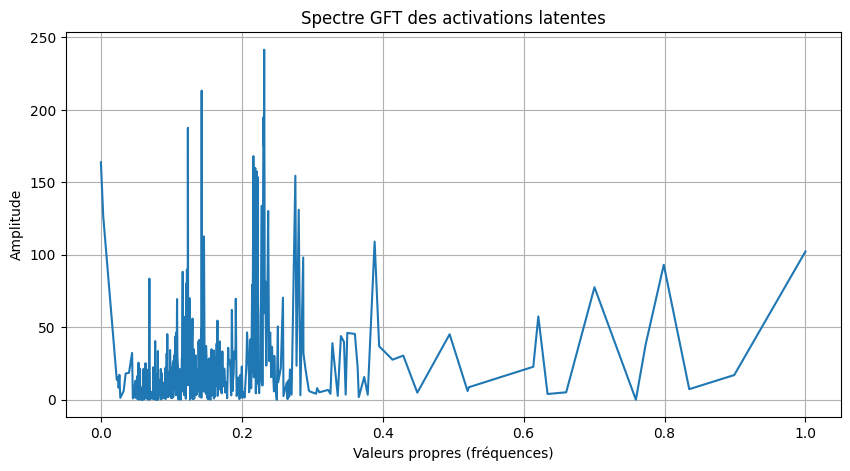

overfit
Modèle chargé avec succès.
smoothness :  6118.918455387478


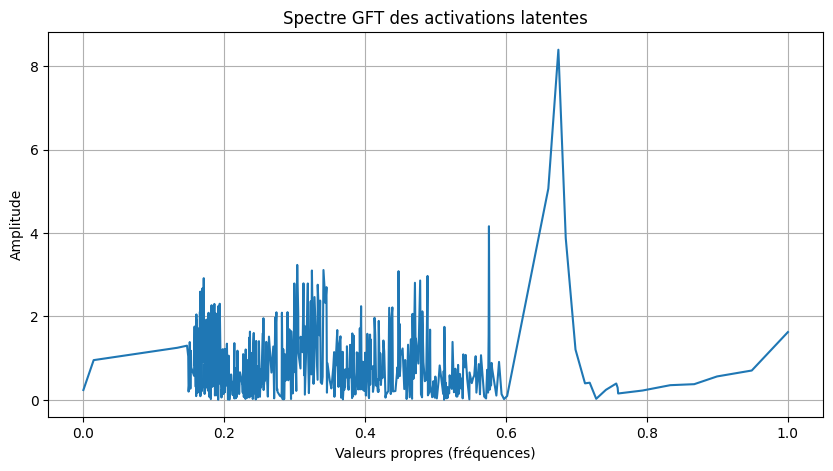

no overfit
Modèle chargé avec succès.
smoothness :  4534038.303464131


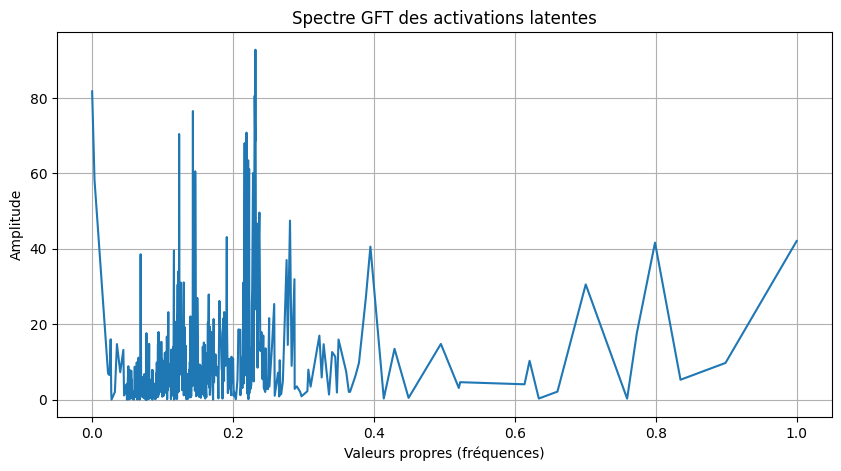

overfit
Modèle chargé avec succès.
smoothness :  11952.679344416081


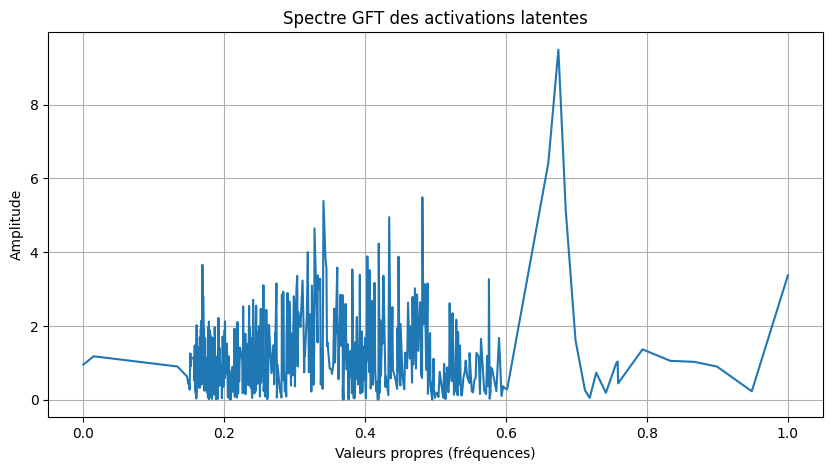

no overfit
Modèle chargé avec succès.
smoothness :  7975289.276936613


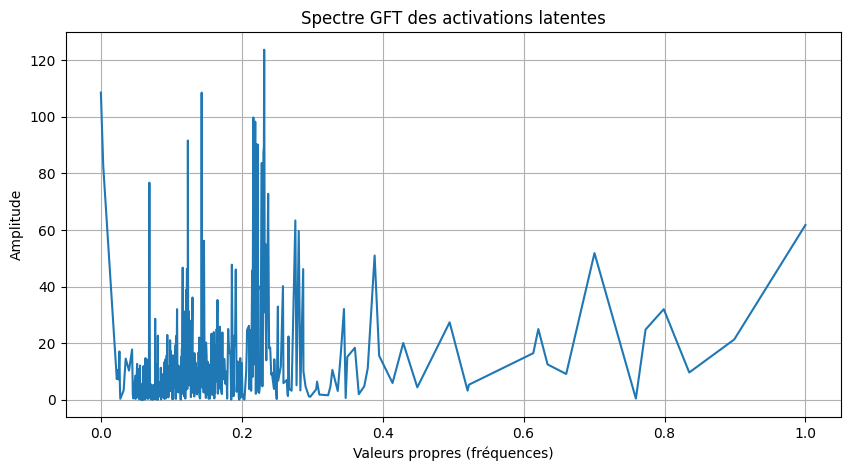

overfit
Modèle chargé avec succès.
smoothness :  10905.208142621419


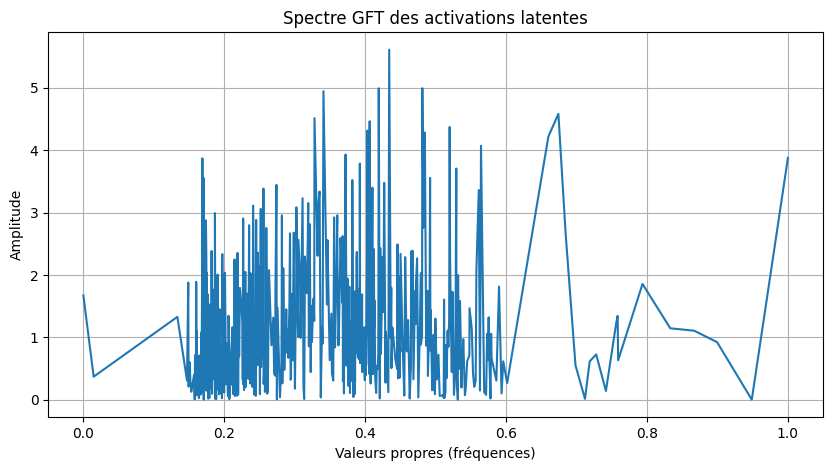

no overfit
Modèle chargé avec succès.
smoothness :  33535773.29065294


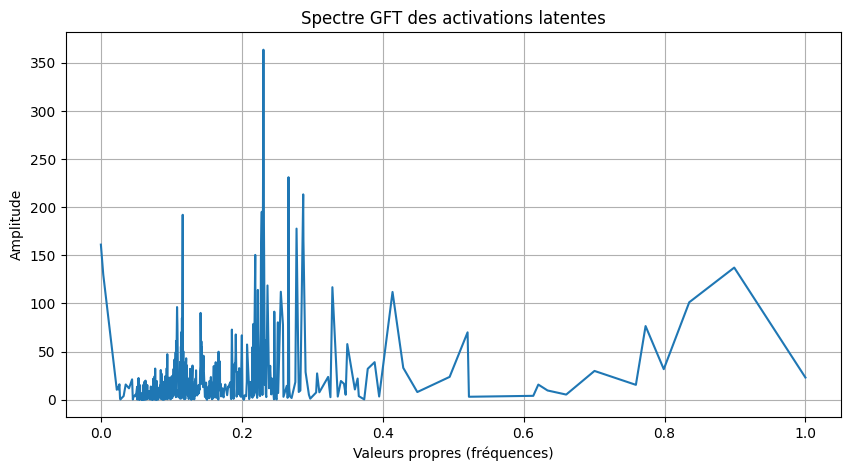

overfit
Modèle chargé avec succès.
smoothness :  9982.773009260025


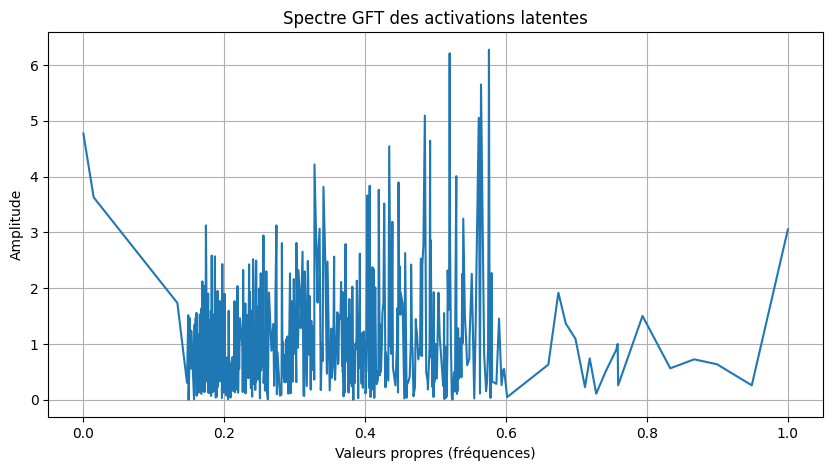

no overfit
Modèle chargé avec succès.
smoothness :  63041889.22743062


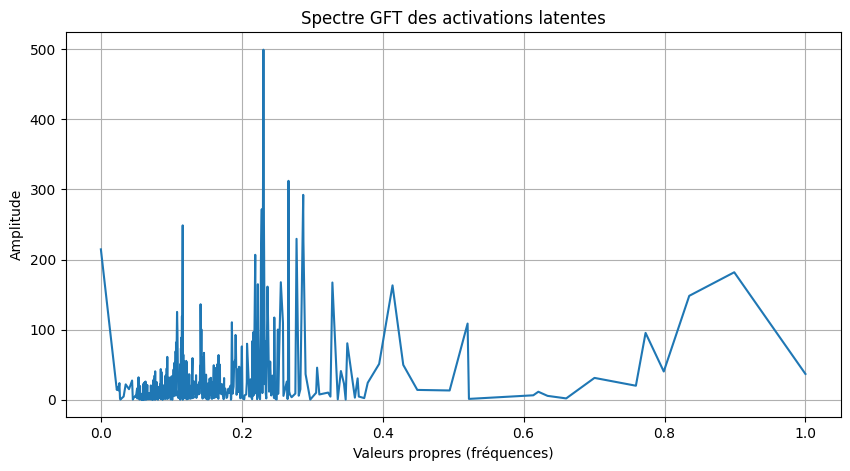

overfit
Modèle chargé avec succès.
smoothness :  4568.690822110168


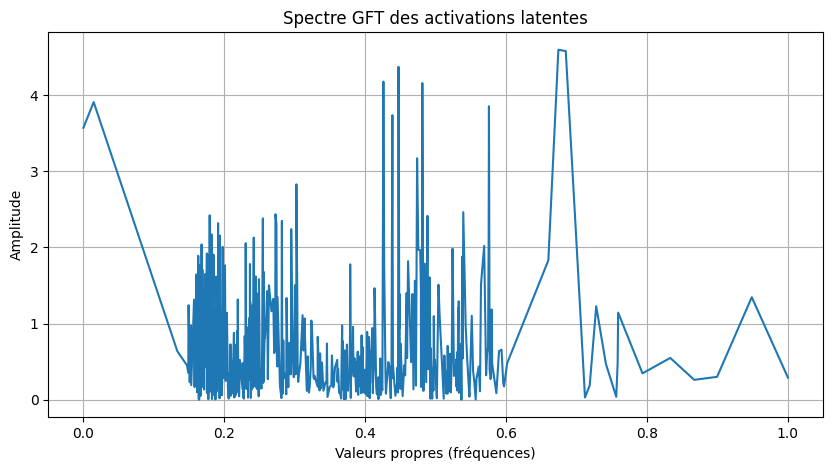

no overfit
Modèle chargé avec succès.
smoothness :  4049294.4061640855


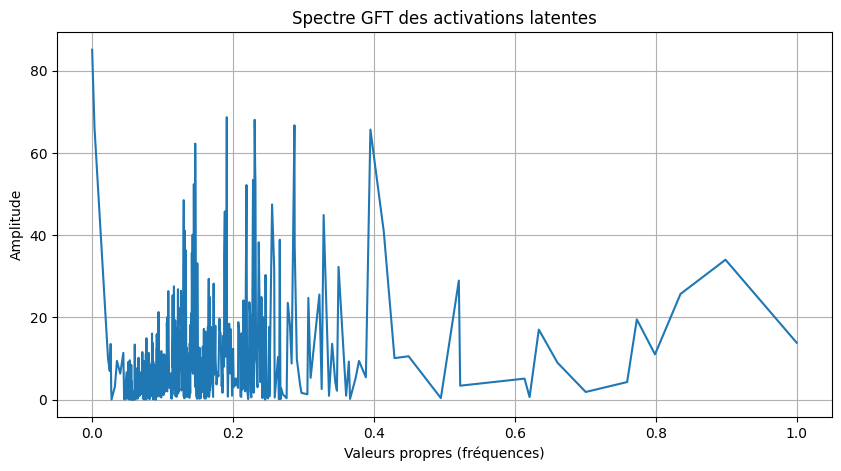

In [125]:
for i in range(10) : 
    print("overfit")
    model_overfit, adjacency_matrix_overfit, layer_sizes_overfit, activations_vector_overfit, laplacian_overfit, eigvals_overfit, gft_spectrum_overfit, smoothness_overfit = AE_Analysis(path_overfit, Xtrain_signals_tensor[i], threshold = 0.1, plot_results=False)
    print("no overfit")
    model_no_overfit, adjacency_matrix_no_overfit, layer_sizes_no_overfit, activations_vector_no_overfit, laplacian_no_overfit, eigvals_no_overfit, gft_spectrum_no_overfit, smoothness_no_overfit = AE_Analysis(path_no_overfit, Xtrain_signals_tensor[i], threshold = 0.1, plot_results=False)

C:\Users\zehav\AppData\Local\Temp\ipykernel_34608\2889267172.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))  # Charger les

Modèle chargé avec succès.
0.2856830060482025
(590, 590)


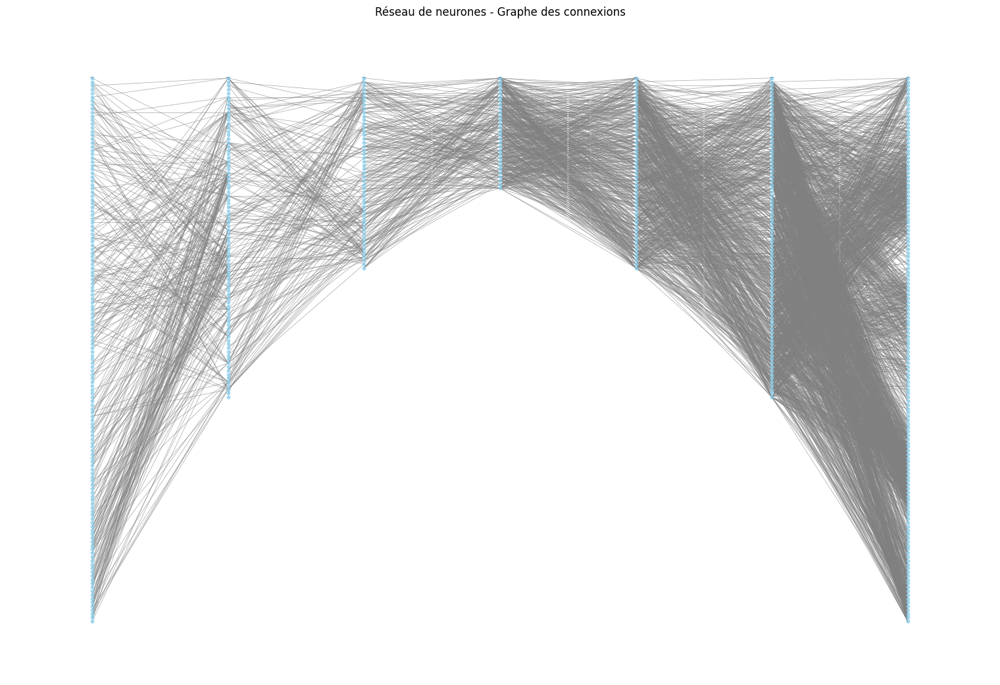

(590,)


c:\Users\zehav\OneDrive\Bureau\ENS\S5_ARIA\stage_3mois_graph\Projet_github\.venv\Lib\site-packages\networkx\drawing\nx_pylab.py:457: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  node_collection = ax.scatter(


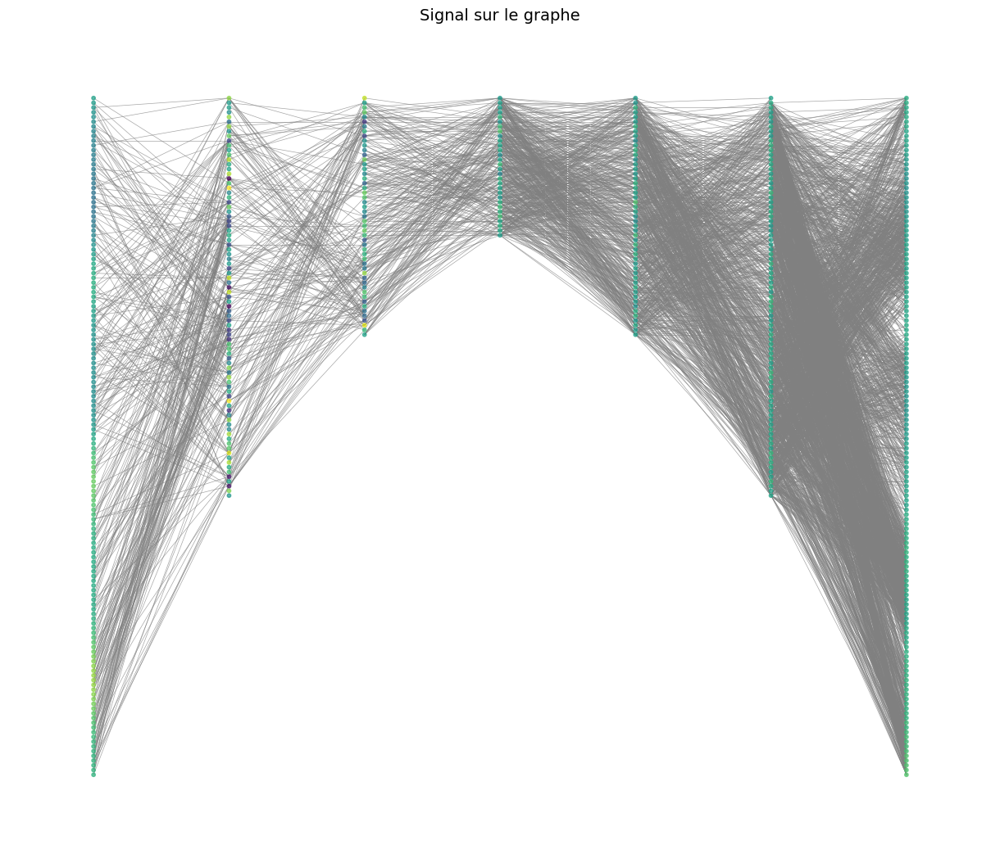

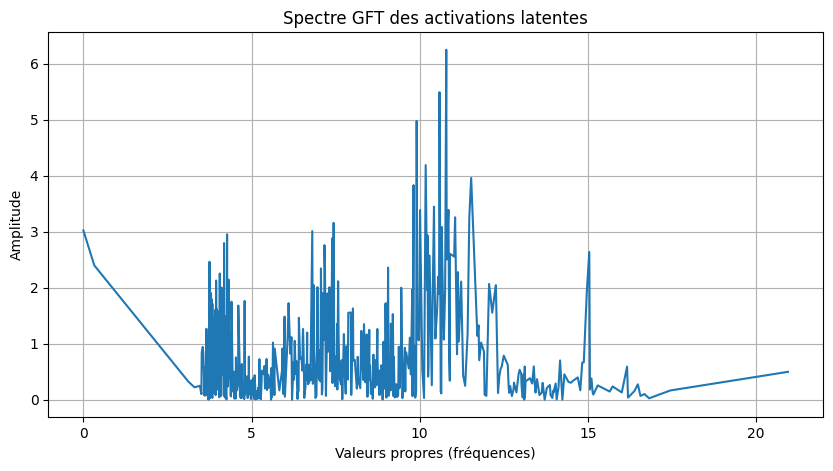

In [99]:
model_overfit = load_model(path_overfit, nsize, latent_dim, deepness_size)
# construction du graph 
W, layers_size = build_adjacency_matrix_from_model(model_overfit)
print(np.max(W))
print(W.shape)
plot_neural_network_graph(W, layers_size, threshold=0.12)
activations = get_all_neuron_activations(model_overfit, Xtrain_signals_tensor[0])
print(activations.shape)
#affichage de l'activation des neuronnes
plot_signal_on_graph(W, layers_size, activations, threshold=0.12)
L = compute_laplacian(W)
lambdas, gft_activations = compute_gft(activations, L)
plot_gft_spectrum(lambdas, gft_activations)

# with torch.no_grad():
#     signal_output, latent = model_overfit.forward(Xtrain_signals_tensor[0])
# plt.clf()
# plt.plot(Xtrain_signals_tensor[0], label='input real data')
# plt.plot(signal_output.detach().numpy(), label='output real data')
# plt.legend()
# plt.show()
# latent.size()


C:\Users\zehav\AppData\Local\Temp\ipykernel_34608\1053134207.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))  # Charger les

Modèle chargé avec succès.
7.852652549743652
(590, 590)


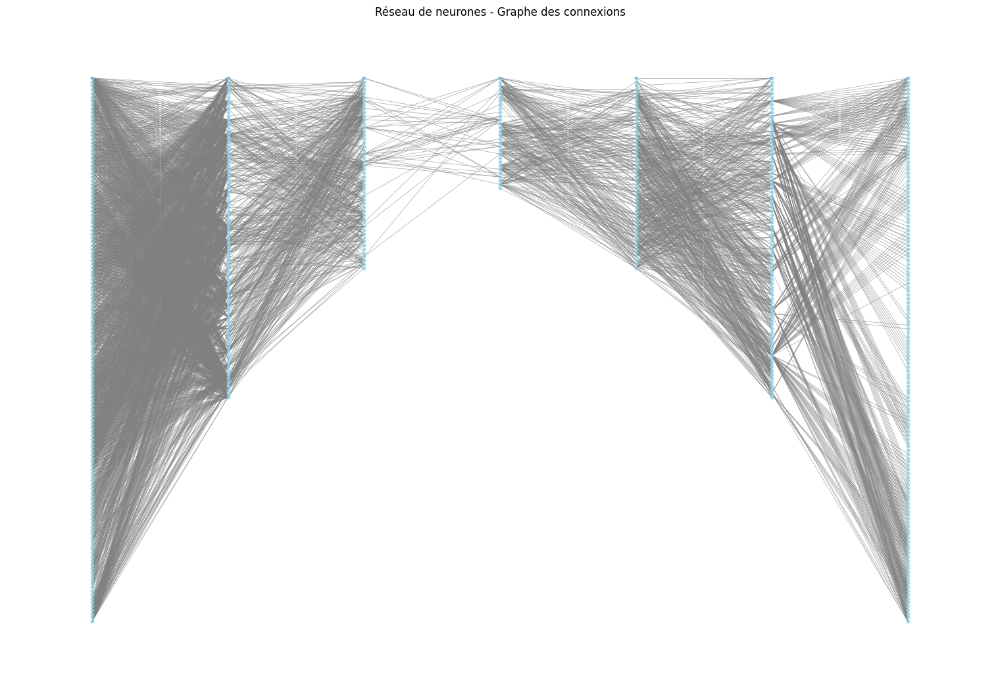

(590,)


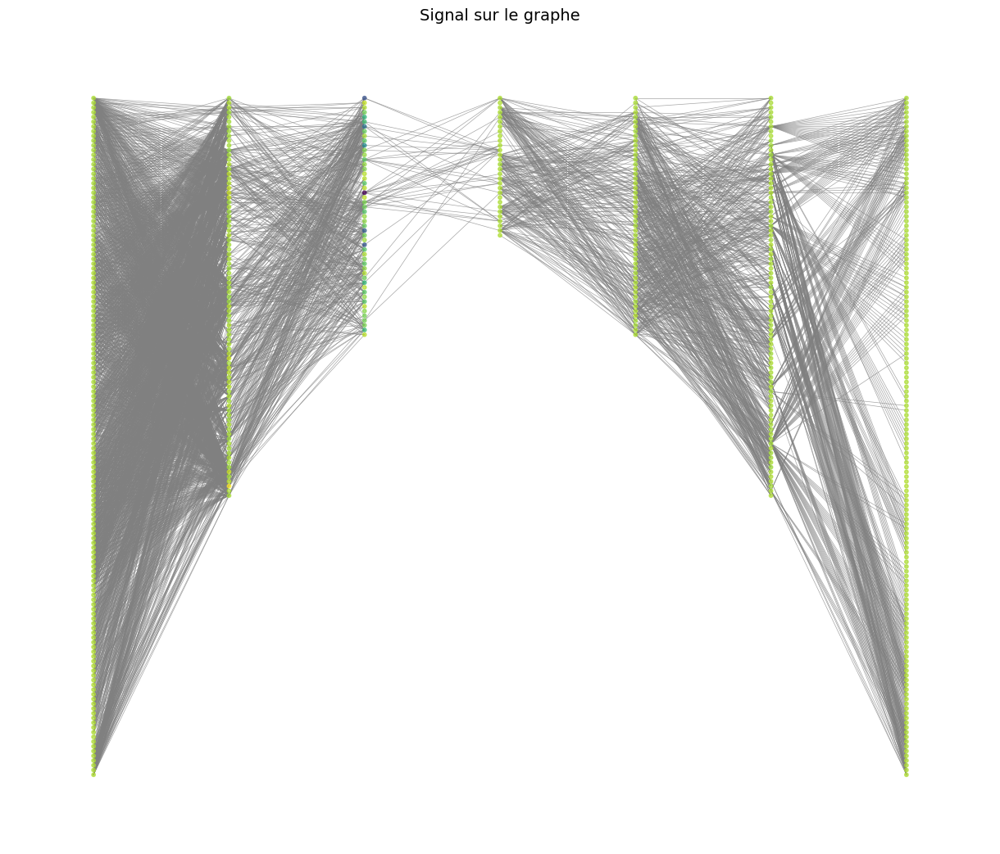

In [91]:
model_no_overfit = load_model(path_no_overfit, nsize, latent_dim, deepness_size)
# construction du graph 
W, layers_size = build_adjacency_matrix_from_model(model_no_overfit)
print(np.max(W))
print(W.shape)
plot_neural_network_graph(W, layers_size, threshold=0.4)
activations = get_all_neuron_activations(model_no_overfit, Xtrain_signals_tensor[0])
print(activations.shape)
#affichage de l'activation des neuronnes
plot_signal_on_graph(W, layers_size, activations, threshold=0.4)


# with torch.no_grad():
#     signal_output, latent = model_overfit.forward(Xtrain_signals_tensor[0])
# plt.clf()
# plt.plot(Xtrain_signals_tensor[0], label='input real data')
# plt.plot(signal_output.detach().numpy(), label='output real data')
# plt.legend()
# plt.show()
# latent.size()
